<a href="https://colab.research.google.com/github/Al-goritmus/Portfolio/blob/master/Neural_Networks_Basics_Using_Tensor_Flow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

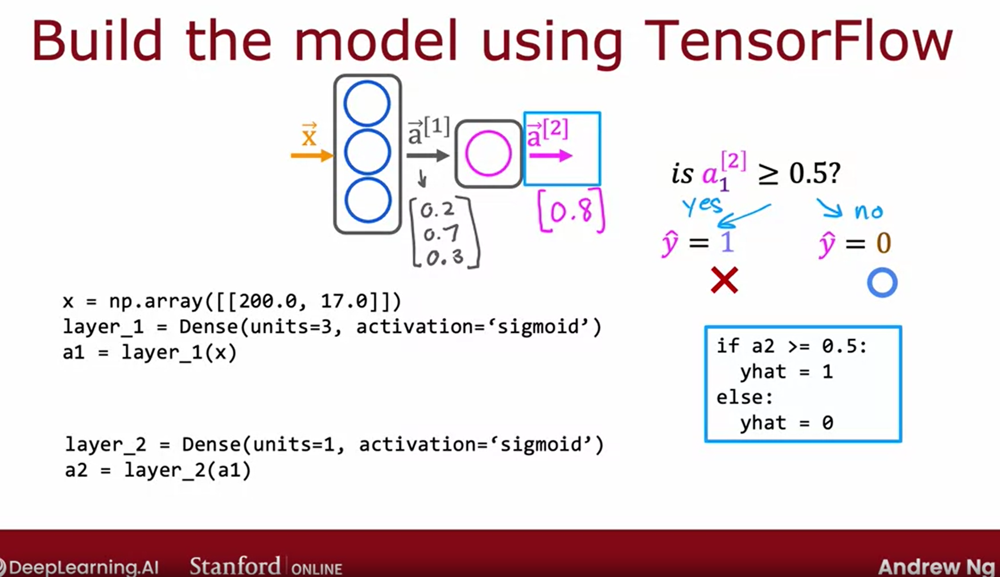

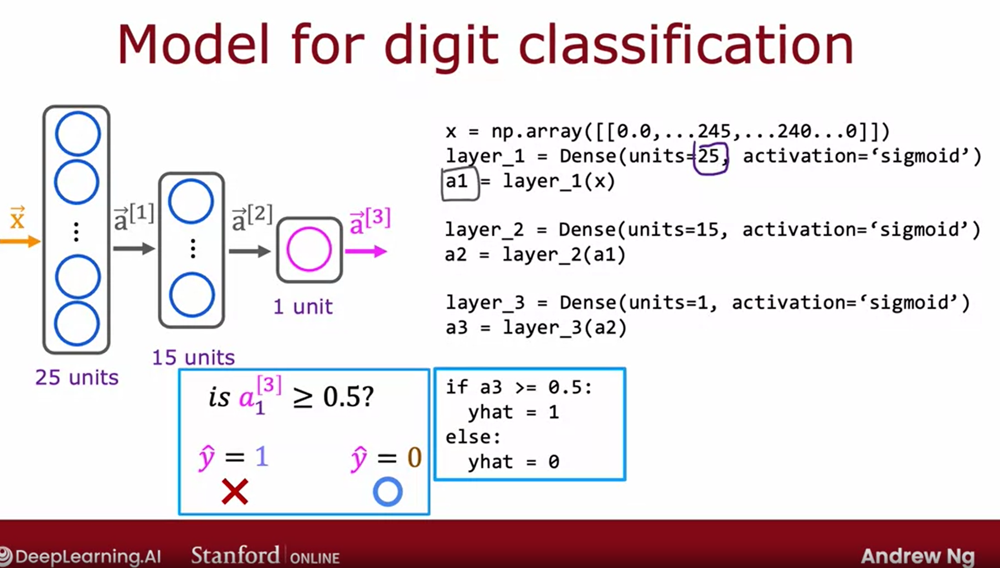

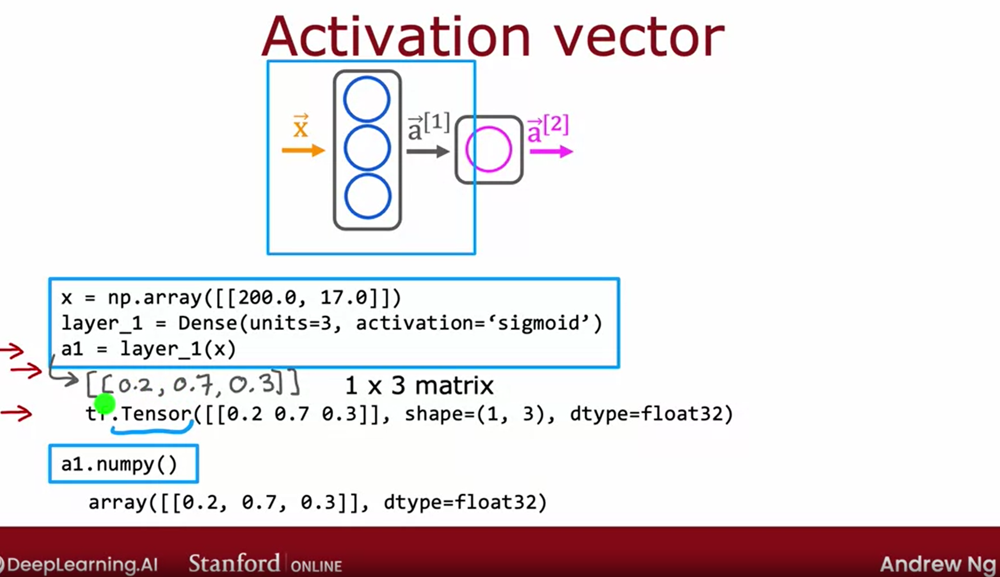

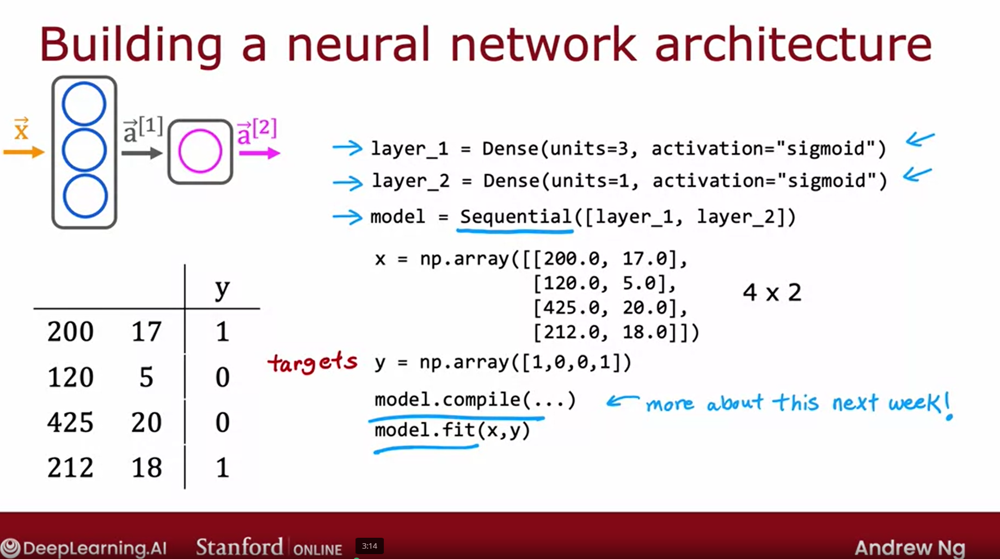

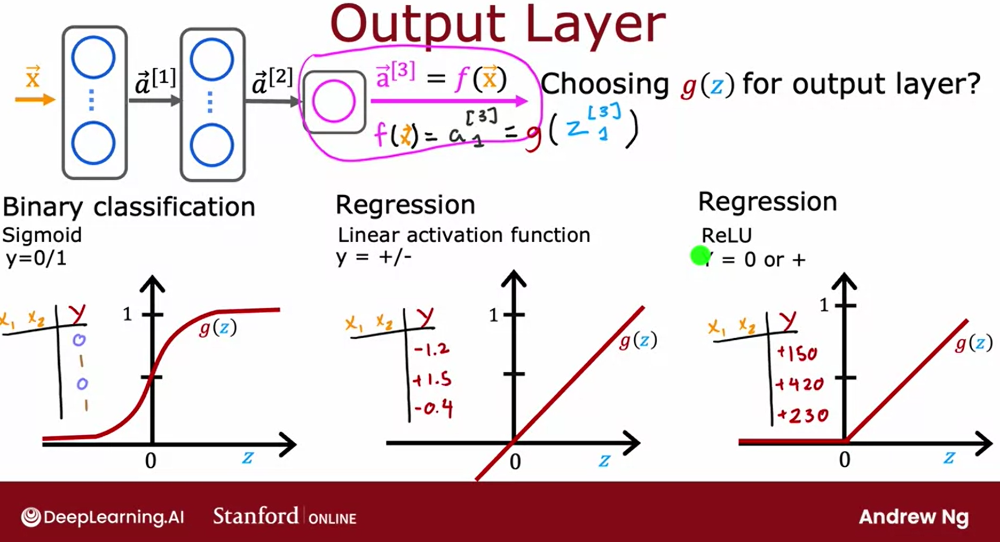

In [ ]:
!pip install tensorflow
!pip install keras
!pip install ipympl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.6/511.6 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 46.0 MB/s eta 0:00:00


In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU
from tensorflow.keras.activations import linear, relu, sigmoid
import matplotlib.pyplot as plt
%matplotlib inline
%matplotlib widget
from google.colab import widgets
from matplotlib.widgets import Slider
import matplotlib.widgets as widgvis
from matplotlib import cm
import matplotlib.colors as colors
import warnings
warnings.simplefilter(action='ignore', category=UserWarning)


In [ ]:
dlc = dict(dlblue = '#0096ff', dlorange = '#FF9300', dldarkred='#C00000', dlmagenta='#FF40FF', dlpurple='#7030A0', dldarkblue =  '#0D5BDC', dlmedblue='#4285F4')

In [ ]:
def plt_act_trio():
    X = np.linspace(-5,5,100)
    fig,ax = plt.subplots(1,3, figsize=(6,2))
    widgvis(fig)
    ax[0].plot(X,tf.keras.activations.linear(X))
    ax[0].axvline(0, lw=0.3, c="black")
    ax[0].axhline(0, lw=0.3, c="black")
    ax[0].set_title("Linear")
    ax[1].plot(X,tf.keras.activations.sigmoid(X))
    ax[1].axvline(0, lw=0.3, c="black")
    ax[1].axhline(0, lw=0.3, c="black")
    ax[1].set_title("Sigmoid")
    ax[2].plot(X,tf.keras.activations.relu(X))
    ax[2].axhline(0, lw=0.3, c="black")
    ax[2].axvline(0, lw=0.3, c="black")
    ax[2].set_title("ReLu")
    fig.suptitle("Common Activation Functions", fontsize=14)
    fig.tight_layout(pad=0.2)
    plt.show()

def widgvis(fig):
    fig.canvas.toolbar_visible = False
    fig.canvas.header_visible = False
    fig.canvas.footer_visible = False
    
    
def plt_base(ax):
    X = np.linspace(0, 3, 3*100)
    y = np.r_[ -2*X[0:100]+2, 1*X[100:200]-3+2, 3*X[200:300]-7+2 ]
    w00 = -2
    b00 =  2
    w01 =  0  #  1
    b01 =  0  # -1
    w02 =  0  #  2
    b02 =  0  # -4
    ax[0].plot(X, y, color = dlc["dlblue"], label="target")
    arts = []
    arts.extend( plt_yhat(ax[0], X, w00, b00, w01, b01, w02, b02) )
    _ = plt_unit(ax[1], X, w00, b00)   #Fixed
    arts.extend( plt_unit(ax[2], X, w01, b01) )
    arts.extend( plt_unit(ax[3], X, w02, b02) )
    return(X, arts)

def plt_yhat(ax, X, w00, b00, w01, b01, w02, b02):
    yhat = np.maximum(0, np.dot(w00, X) + b00) + \
            np.maximum(0, np.dot(w01, X) + b01) + \
            np.maximum(0, np.dot(w02, X) + b02)
    lp = ax.plot(X, yhat, lw=2, color = dlc["dlorange"], label="a2")
    return(lp)

def plt_unit(ax, X, w, b):
    z = np.dot(w,X) + b
    yhat = np.maximum(0,z)
    lpa = ax.plot(X, z,    dlc["dlblue"], label="z")
    lpb = ax.plot(X, yhat, dlc["dlmagenta"], lw=1, label="a")
    return([lpa[0], lpb[0]])

# if output is need for debug, put this in a cell and call ahead of time. Output will be below that cell.
#from ipywidgets import Output   #this line stays here
#output = Output()               #this line stays here
#display(output)                 #this line goes in notebook

def plt_relu_ex():
    artists = []

    fig = plt.figure()
    fig.suptitle("Explore Non-Linear Activation")

    gs = GridSpec(3, 2, width_ratios=[2, 1], height_ratios=[1, 1, 1])
    ax1 = fig.add_subplot(gs[0:2,0])
    ax2 = fig.add_subplot(gs[0,1])
    ax3 = fig.add_subplot(gs[1,1])
    ax4 = fig.add_subplot(gs[2,1])
    ax = [ax1,ax2,ax3,ax4]
    
    widgvis(fig)
    #plt.subplots_adjust(bottom=0.35)

    axb2 = fig.add_axes([0.15, 0.10, 0.30, 0.03]) # [left, bottom, width, height]
    axw2 = fig.add_axes([0.15, 0.15, 0.30, 0.03])
    axb1 = fig.add_axes([0.15, 0.20, 0.30, 0.03])
    axw1 = fig.add_axes([0.15, 0.25, 0.30, 0.03])

    sw1 = Slider(axw1, 'w1', -4.0, 4.0, valinit=0, valstep=0.1)
    sb1 = Slider(axb1, 'b1', -4.0, 4.0, valinit=0, valstep=0.1)
    sw2 = Slider(axw2, 'w2', -4.0, 4.0, valinit=0, valstep=0.1)
    sb2 = Slider(axb2, 'b2', -4.0, 4.0, valinit=0, valstep=0.1)
    
    X,lp = plt_base(ax)
    artists.extend( lp )
    
    #@output.capture()
    def update(val):
        #print("-----------")
        #print(f"len artists {len(artists)}", artists)
        for i in range(len(artists)):
            artist = artists[i]
            #print("artist:", artist)
            artist.remove()
        artists.clear()
        #print(artists)
        w00 = -2
        b00 =  2
        w01 =  sw1.val  #  1
        b01 =  sb1.val  # -1
        w02 =  sw2.val  #  2
        b02 =  sb2.val  # -4
        artists.extend(plt_yhat(ax[0], X, w00, b00, w01, b01, w02, b02))
        artists.extend(plt_unit(ax[2], X, w01, b01) )
        artists.extend(plt_unit(ax[3], X, w02, b02) )
        #fig.canvas.draw_idle()
        
    sw1.on_changed(update)
    sb1.on_changed(update)
    sw2.on_changed(update)
    sb2.on_changed(update)

    ax[0].set_title(" Match Target ")
    ax[0].legend()
    ax[0].set_xlabel("x")
    ax[1].set_title("Unit 0 (fixed) ")
    ax[1].legend()
    ax[2].set_title("Unit 1")
    ax[2].legend() 
    ax[3].set_title("Unit 2")
    ax[3].legend()
    plt.tight_layout()

    plt.show()
    return([sw1,sw2,sb1,sb2,artists]) # returned to keep a live reference to sliders



<a name="2"></a>
## 2 - ReLU Activation
This week, a new activation was introduced, the Rectified Linear Unit (ReLU). 
$$ a = max(0,z) \quad\quad\text {# ReLU function} $$

In [ ]:
def widgvis(fig):
    fig.canvas.toolbar_visible = False
    fig.canvas.header_visible = False
    fig.canvas.footer_visible = False

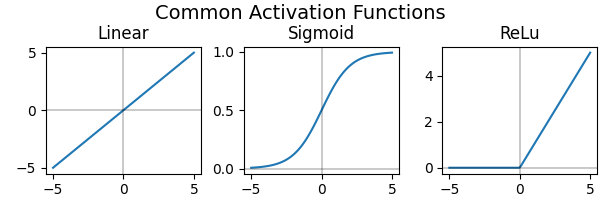

In [ ]:
plt_act_trio()

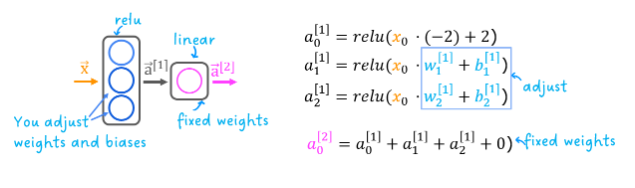

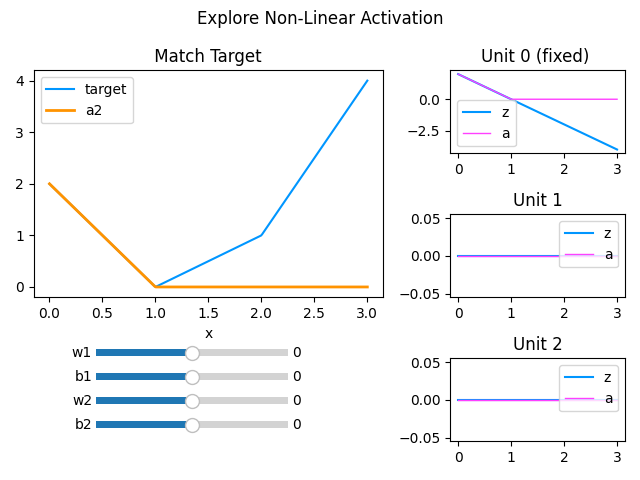

In [ ]:
_ = plt_relu_ex()

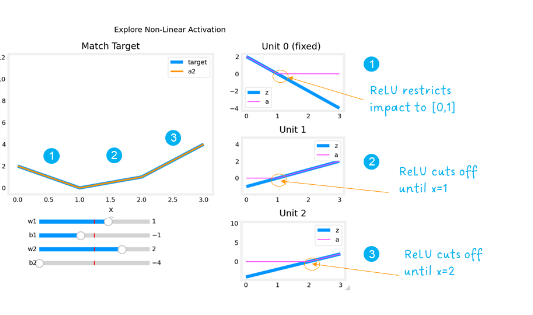

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

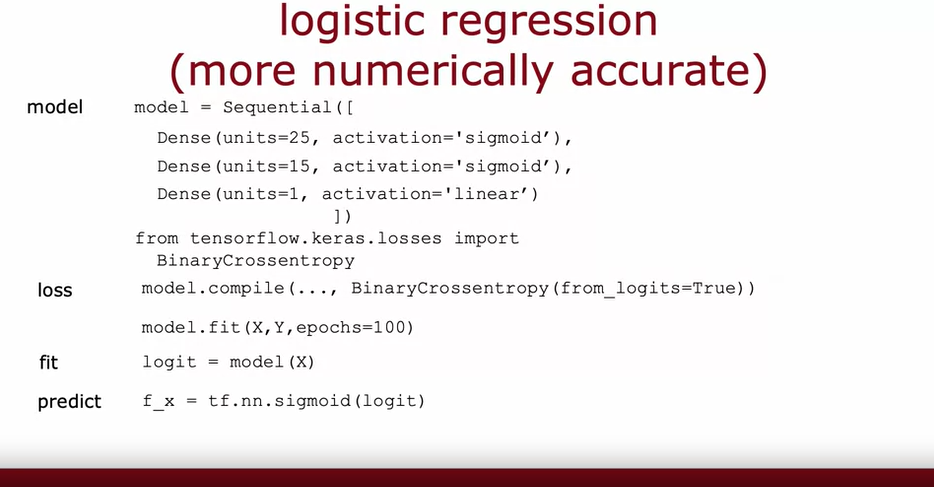

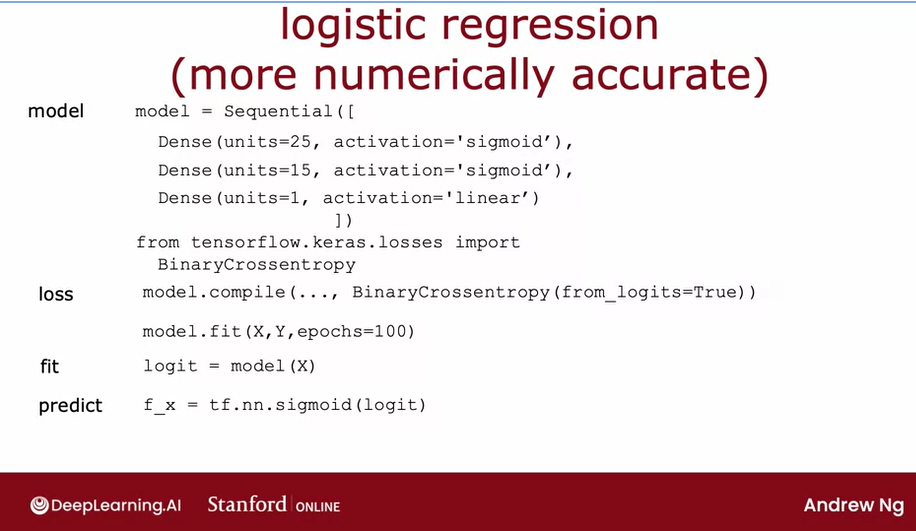

##laboratorio softmax


In [ ]:
from IPython.display import display, Markdown, Latex
from sklearn.datasets import make_blobs

In [ ]:
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)
tf.autograph.set_verbosity(0)

In [ ]:
def plt_softmax(my_softmax):
    fig, ax = plt.subplots(1,2,figsize=(8,4))
    plt.subplots_adjust(bottom=0.35)

    axz0 = fig.add_axes([0.15, 0.10, 0.30, 0.03]) # [left, bottom, width, height]
    axz1 = fig.add_axes([0.15, 0.15, 0.30, 0.03])
    axz2 = fig.add_axes([0.15, 0.20, 0.30, 0.03])
    axz3 = fig.add_axes([0.15, 0.25, 0.30, 0.03])

    z3 = Slider(axz3, 'z3', 0.1, 10.0, valinit=4, valstep=0.1)
    z2 = Slider(axz2, 'z2', 0.1, 10.0, valinit=3, valstep=0.1)
    z1 = Slider(axz1, 'z1', 0.1, 10.0, valinit=2, valstep=0.1)
    z0 = Slider(axz0, 'z0', 0.1, 10.0, valinit=1, valstep=0.1)

    z = np.array(['z0','z1','z2','z3'])
    bar = ax[0].barh(z, height=0.6, width=[z0.val,z1.val,z2.val,z3.val], left=None, align='center')
    bars = bar.get_children()
    ax[0].set_xlim([0,10])
    ax[0].set_title("z input to softmax")

    a = my_softmax(np.array([z0.val,z1.val,z2.val,z3.val]))
    anames = np.array(['a0','a1','a2','a3'])
    sbar = ax[1].barh(anames, height=0.6, width=a, left=None, align='center',color=dlc["dldarkred"])
    sbars = sbar.get_children()
    ax[1].set_xlim([0,1])
    ax[1].set_title("softmax(z)")

    def update(val):
        bars[0].set_width(z0.val)
        bars[1].set_width(z1.val)
        bars[2].set_width(z2.val)
        bars[3].set_width(z3.val)
        a = my_softmax(np.array([z0.val,z1.val,z2.val,z3.val]))
        sbars[0].set_width(a[0])
        sbars[1].set_width(a[1])
        sbars[2].set_width(a[2])
        sbars[3].set_width(a[3])

        fig.canvas.draw_idle()

    z0.on_changed(update)
    z1.on_changed(update)
    z2.on_changed(update)
    z3.on_changed(update)

    plt.show()
 

## Softmax Function
In both softmax regression and neural networks with Softmax outputs, N outputs are generated and one output is selected as the predicted category. In both cases a vector $\mathbf{z}$ is generated by a linear function which is applied to a softmax function. The softmax function converts $\mathbf{z}$  into a probability distribution as described below. After applying softmax, each output will be between 0 and 1 and the outputs will add to 1, so that they can be interpreted as probabilities. The larger inputs  will correspond to larger output probabilities.

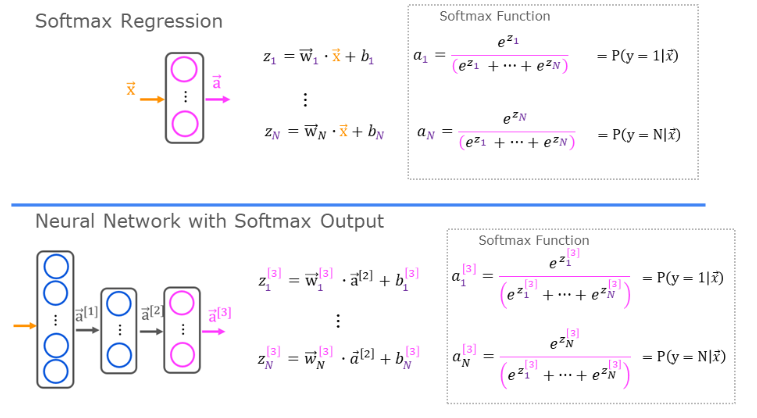

The softmax function can be written:
$$a_j = \frac{e^{z_j}}{ \sum_{k=1}^{N}{e^{z_k} }} \tag{1}$$
The output $\mathbf{a}$ is a vector of length N, so for softmax regression, you could also write:
\begin{align}
\mathbf{a}(x) =
\begin{bmatrix}
P(y = 1 | \mathbf{x}; \mathbf{w},b) \\
\vdots \\
P(y = N | \mathbf{x}; \mathbf{w},b)
\end{bmatrix}
=
\frac{1}{ \sum_{k=1}^{N}{e^{z_k} }}
\begin{bmatrix}
e^{z_1} \\
\vdots \\
e^{z_{N}} \\
\end{bmatrix} \tag{2}
\end{align}

In [ ]:
def my_softmax(z):
    ez = np.exp(z)              #element-wise exponenial
    sm = ez/np.sum(ez)
    return(sm)

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

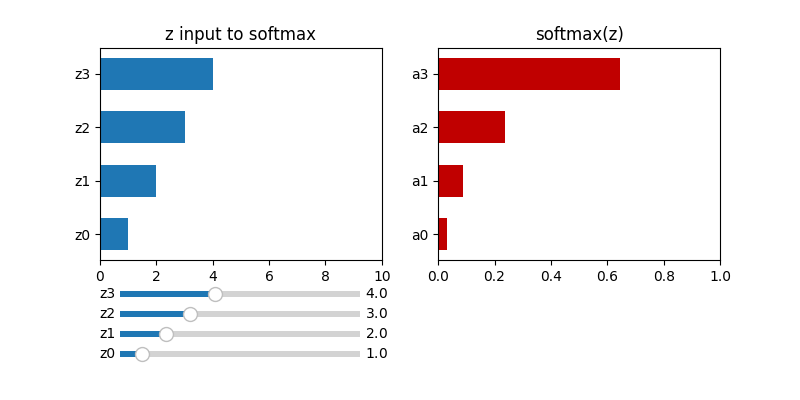

In [ ]:
plt.close("all")
plt_softmax(my_softmax)

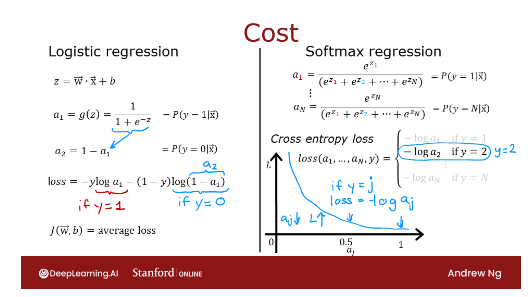

The loss function associated with Softmax, the cross-entropy loss, is:
\begin{equation}
  L(\mathbf{a},y)=\begin{cases}
    -log(a_1), & \text{if $y=1$}.\\
        &\vdots\\
     -log(a_N), & \text{if $y=N$}
  \end{cases} \tag{3}
\end{equation}

Where y is the target category for this example and $\mathbf{a}$ is the output of a softmax function. In particular, the values in $\mathbf{a}$ are probabilities that sum to one.
>**Recall:** In this course, Loss is for one example while Cost covers all examples. 
 
 
Note in (3) above, only the line that corresponds to the target contributes to the loss, other lines are zero. To write the cost equation we need an 'indicator function' that will be 1 when the index matches the target and zero otherwise. 
    $$\mathbf{1}\{y == n\} = =\begin{cases}
    1, & \text{if $y==n$}.\\
    0, & \text{otherwise}.
  \end{cases}$$

Now the cost is:
\begin{align}
J(\mathbf{w},b) = -\frac{1}{m} \left[ \sum_{i=1}^{m} \sum_{j=1}^{N}  1\left\{y^{(i)} == j\right\} \log \frac{e^{z^{(i)}_j}}{\sum_{k=1}^N e^{z^{(i)}_k} }\right] \tag{4}
\end{align}

Where $m$ is the number of examples, $N$ is the number of outputs. This is the average of all the losses.


## Tensorflow
This lab will discuss two ways of implementing the softmax, cross-entropy loss in Tensorflow, the 'obvious' method and the 'preferred' method. The former is the most straightforward while the latter is more numerically stable.

Let's start by creating a dataset to train a multiclass classification model.

# make  dataset for example
centers = [[-5, 2], [-2, -2], [1, 2], [5, -2]]
X_train, y_train = make_blobs(n_samples=2000, centers=centers, cluster_std=1.0,random_state=30)

In [ ]:
import tensorflow as tf
from sklearn.datasets import make_blobs
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU
from tensorflow.keras.activations import linear, relu, sigmoid
from tensorflow.keras.losses import SparseCategoricalCrossentropy

In [ ]:
# make  dataset for example
centers = [[-5, 2], [-2, -2], [1, 2], [5, -2]]
X_train, y_train = make_blobs(n_samples=2000, centers=centers, cluster_std=1.0,random_state=30)

The model below is implemented with the softmax as an activation in the final Dense layer.
The loss function is separately specified in the `compile` directive. 

The loss function is `SparseCategoricalCrossentropy`. This loss is described in (3) above. In this model, the softmax takes place in the last layer. The loss function takes in the softmax output which is a vector of probabilities. 

In [ ]:
model = Sequential(
    [
        Dense(25, activation='relu'),
        Dense(15, activation='relu'),
        Dense(4, activation='softmax')
    ]
)
model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(0.001),
)

model.fit(
    X_train, y_train,
    epochs=10
)

Epoch 1/10
63/63 [==============================] - 3s 2ms/step - loss: 0.7286
Epoch 2/10
63/63 [==============================] - 0s 2ms/step - loss: 0.2731
Epoch 3/10
63/63 [==============================] - 0s 2ms/step - loss: 0.1364
Epoch 4/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0882
Epoch 5/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0675
Epoch 6/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0558
Epoch 7/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0489
Epoch 8/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0438
Epoch 9/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0398
Epoch 10/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0368


In [ ]:
p_nonpreferred = model.predict(X_train)
print(p_nonpreferred [:2])
print("largest value", np.max(p_nonpreferred), "smallest value", np.min(p_nonpreferred))

63/63 [==============================] - 0s 2ms/step
[[1.8468203e-03 1.3601324e-03 9.7333270e-01 2.3460224e-02]
 [9.9542350e-01 3.9590583e-03 5.6573201e-04 5.1639374e-05]]
largest value 0.9999979 smallest value 5.037062e-09


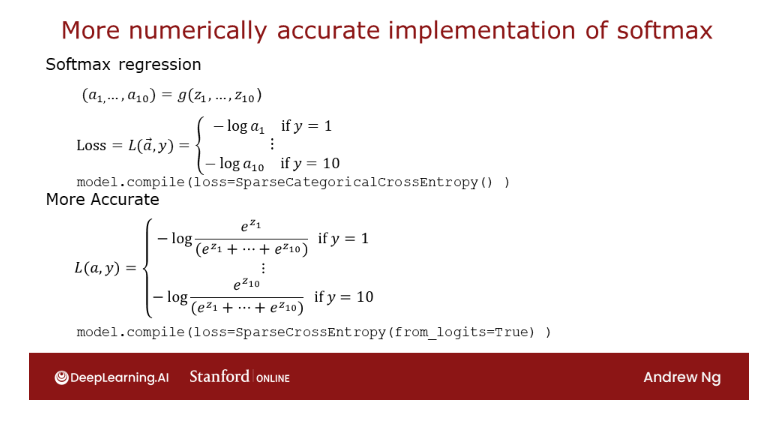

In [ ]:
preferred_model = Sequential(
    [ 
        Dense(25, activation = 'relu'),
        Dense(15, activation = 'relu'),
        Dense(4, activation = 'linear')   #<-- Note
    ]
)
preferred_model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),  #<-- Note
    optimizer=tf.keras.optimizers.Adam(0.001),
)

preferred_model.fit(
    X_train,y_train,
    epochs=10
)

Epoch 1/10
63/63 [==============================] - 2s 3ms/step - loss: 1.3525
Epoch 2/10
63/63 [==============================] - 0s 4ms/step - loss: 0.5982
Epoch 3/10
63/63 [==============================] - 0s 2ms/step - loss: 0.2663
Epoch 4/10
63/63 [==============================] - 0s 2ms/step - loss: 0.1379
Epoch 5/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0914
Epoch 6/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0726
Epoch 7/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0627
Epoch 8/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0564
Epoch 9/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0522
Epoch 10/10
63/63 [==============================] - 0s 2ms/step - loss: 0.0488


#### Output Handling
Notice that in the preferred model, the outputs are not probabilities, but can range from large negative numbers to large positive numbers. The output must be sent through a softmax when performing a prediction that expects a probability. 
Let's look at the preferred model outputs:

In [ ]:
p_preferred = preferred_model.predict(X_train)
print(f"two example output vectors:\n {p_preferred[:2]}")
print("largest value", np.max(p_preferred), "smallest value", np.min(p_preferred))

63/63 [==============================] - 0s 2ms/step
two example output vectors:
 [[-3.7942932  -4.9197726   2.1211295  -1.0796641 ]
 [ 4.824841   -0.17268188 -6.154838   -6.0525556 ]]
largest value 8.353866 smallest value -13.803681


The output predictions are not probabilities!
If the desired output are probabilities, the output should be be processed by a [softmax](https://www.tensorflow.org/api_docs/python/tf/nn/softmax).

In [ ]:
sm_preferred = tf.nn.softmax(p_preferred).numpy()
print(f"two example output vectors:\n {sm_preferred[:2]}")
print("largest value", np.max(sm_preferred), "smallest value", np.min(sm_preferred))

two example output vectors:
 [[2.5830823e-03 8.3820190e-04 9.5757675e-01 3.9001968e-02]
 [9.9325520e-01 6.7090997e-03 1.6929605e-05 1.8752860e-05]]
largest value 0.99999803 smallest value 1.0099347e-09


To select the most likely category, the softmax is not required. One can find the index of the largest output using [np.argmax()](https://numpy.org/doc/stable/reference/generated/numpy.argmax.html).

## SparseCategorialCrossentropy or CategoricalCrossEntropy
Tensorflow has two potential formats for target values and the selection of the loss defines which is expected.
- SparseCategorialCrossentropy: expects the target to be an integer corresponding to the index. For example, if there are 10 potential target values, y would be between 0 and 9. 
- CategoricalCrossEntropy: Expects the target value of an example to be one-hot encoded where the value at the target index is 1 while the other N-1 entries are zero. An example with 10 potential target values, where the target is 2 would be [0,0,1,0,0,0,0,0,0,0].


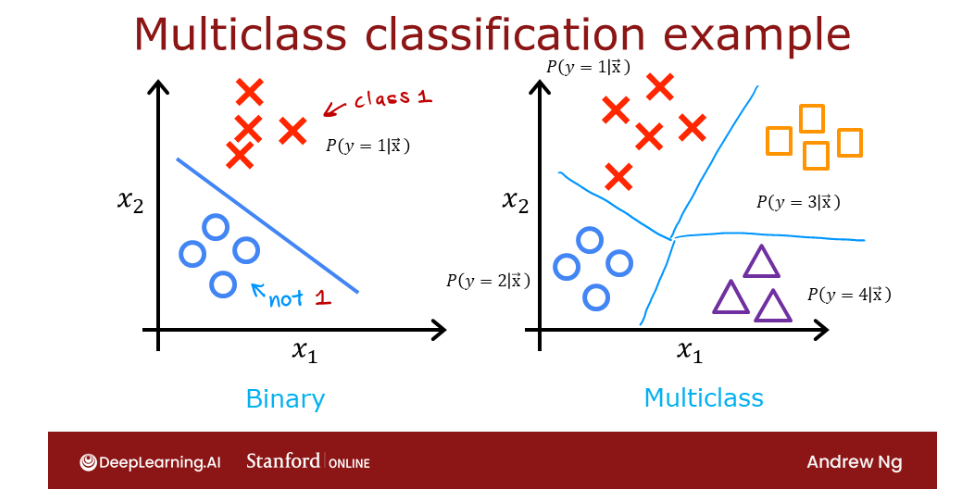

##LAB UTILS MULTICLASS_TF

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import warnings
from matplotlib import cm
from matplotlib.patches import FancyArrowPatch
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import matplotlib.colors as colors
from matplotlib import cm



dlc = dict(dlblue = '#0096ff', dlorange = '#FF9300', dldarkred='#C00000', dlmagenta='#FF40FF', dlpurple='#7030A0', dldarkblue =  '#0D5BDC')
dlblue = '#0096ff'; dlorange = '#FF9300'; dldarkred='#C00000'; dlmagenta='#FF40FF'; dlpurple='#7030A0'; dldarkblue =  '#0D5BDC'
dlcolors = [dlblue, dlorange, dldarkred, dlmagenta, dlpurple]

dkcolors = plt.cm.Paired((1,3,7,9,5,11))
ltcolors = plt.cm.Paired((0,2,6,8,4,10))
dkcolors_map = mpl.colors.ListedColormap(dkcolors)
ltcolors_map = mpl.colors.ListedColormap(ltcolors)

#Plot a multi-class categorical decision boundary
# This version handles a non-vector prediction (adds a for-loop over points)
def plot_cat_decision_boundary_mc(ax, X, predict , class_labels=None, legend=False, vector=True):

    # create a mesh to points to plot
    x_min, x_max = X[:, 0].min()- 0.5, X[:, 0].max()+0.5
    y_min, y_max = X[:, 1].min()- 0.5, X[:, 1].max()+0.5
    h = max(x_max-x_min, y_max-y_min)/100
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    points = np.c_[xx.ravel(), yy.ravel()]
    #print("points", points.shape)
    #print("xx.shape", xx.shape)

    #make predictions for each point in mesh
    if vector:
        Z = predict(points)
    else:
        Z = np.zeros((len(points),))
        for i in range(len(points)):
            Z[i] = predict(points[i].reshape(1,2))
    Z = Z.reshape(xx.shape)

    #contour plot highlights boundaries between values - classes in this case
    ax.contour(xx, yy, Z, linewidths=1) 
    #ax.axis('tight')

      
def plt_mc_data(ax, X, y, classes,  class_labels=None, map=plt.cm.Paired, 
                legend=False, size=50, m='o', equal_xy = False):
    """ Plot multiclass data. Note, if equal_xy is True, setting ylim on the plot may not work """
    for i in range(classes):
        idx = np.where(y == i)
        col = len(idx[0])*[i]
        label = class_labels[i] if class_labels else "c{}".format(i)
        # this didn't work on coursera but did in local version
        #ax.scatter(X[idx, 0], X[idx, 1],  marker=m,
        #            c=col, vmin=0, vmax=map.N, cmap=map,
        #            s=size, label=label)
        ax.scatter(X[idx, 0], X[idx, 1],  marker=m,
                    color=map(col), vmin=0, vmax=map.N, 
                    s=size, label=label)
    if legend: ax.legend()
    if equal_xy: ax.axis("equal")

def plt_mc(X_train,y_train,classes, centers, std):
    css = np.unique(y_train)
    fig,ax = plt.subplots(1,1,figsize=(3,3))
    fig.canvas.toolbar_visible = False
    fig.canvas.header_visible = False
    fig.canvas.footer_visible = False
    plt_mc_data(ax, X_train,y_train,classes, map=dkcolors_map, legend=True, size=50, equal_xy = False)
    ax.set_title("Multiclass Data")
    ax.set_xlabel("x0")
    ax.set_ylabel("x1")
    #for c in css:
    #    circ = plt.Circle(centers[c], 2*std, color=dkcolors_map(c), clip_on=False, fill=False, lw=0.5)
    #    ax.add_patch(circ)
    plt.show()

def plt_cat_mc(X_train, y_train, model, classes):
    #make a model for plotting routines to call
    model_predict = lambda Xl: np.argmax(model.predict(Xl),axis=1)

    fig,ax = plt.subplots(1,1, figsize=(3,3))
    fig.canvas.toolbar_visible = False
    fig.canvas.header_visible = False
    fig.canvas.footer_visible = False
 
    #add the original data to the decison boundary
    plt_mc_data(ax, X_train,y_train, classes, map=dkcolors_map, legend=True)
    #plot the decison boundary. 
    plot_cat_decision_boundary_mc(ax, X_train, model_predict, vector=True)
    ax.set_title("model decision boundary")

    plt.xlabel(r'$x_0$');
    plt.ylabel(r"$x_1$"); 
    plt.show()

    
def plt_prob_z(ax,fwb, x0_rng=(-8,8), x1_rng=(-5,4)):
    """ plots a decision boundary but include shading to indicate the probability
        and adds a conouter to show where z=0
    """
    #setup useful ranges and common linspaces
    x0_space  = np.linspace(x0_rng[0], x0_rng[1], 40)
    x1_space  = np.linspace(x1_rng[0], x1_rng[1], 40)

    # get probability for x0,x1 ranges
    tmp_x0,tmp_x1 = np.meshgrid(x0_space,x1_space)
    z = np.zeros_like(tmp_x0)
    c = np.zeros_like(tmp_x0)
    for i in range(tmp_x0.shape[0]):
        for j in range(tmp_x1.shape[1]):
            x = np.array([[tmp_x0[i,j],tmp_x1[i,j]]])
            z[i,j] = fwb(x)
            c[i,j] = 0. if z[i,j] == 0 else 1.
    with warnings.catch_warnings():  # suppress no contour warning
        warnings.simplefilter("ignore")
        #ax.contour(tmp_x0, tmp_x1, c, colors='b', linewidths=1) 
        ax.contour(tmp_x0, tmp_x1, c, linewidths=1) 

    cmap = plt.get_cmap('Blues')
    new_cmap = truncate_colormap(cmap, 0.0, 0.7)

    pcm = ax.pcolormesh(tmp_x0, tmp_x1, z,
                   norm=cm.colors.Normalize(vmin=np.amin(z), vmax=np.amax(z)),
                   cmap=new_cmap, shading='nearest', alpha = 0.9)
    ax.figure.colorbar(pcm, ax=ax)

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    """ truncates color map """
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap


def plt_layer_relu(X, Y, W1, b1, classes):
    nunits = (W1.shape[1])
    Y = Y.reshape(-1,)
    fig,ax = plt.subplots(1,W1.shape[1], figsize=(7,2.5))
    fig.canvas.toolbar_visible = False
    fig.canvas.header_visible = False
    fig.canvas.footer_visible = False

    for i in range(nunits):
        layerf= lambda x : np.maximum(0,(np.dot(x,W1[:,i]) + b1[i]))
        plt_prob_z(ax[i], layerf)
        plt_mc_data(ax[i], X, Y, classes, map=dkcolors_map,legend=True, size=50, m='o')
        ax[i].set_title(f"Layer 1 Unit {i}")
        ax[i].set_ylabel(r"$x_1$",size=10)
        ax[i].set_xlabel(r"$x_0$",size=10)
    fig.tight_layout()
    plt.show()


def plt_output_layer_linear(X, Y, W, b, classes, x0_rng=None, x1_rng=None):
    nunits = (W.shape[1])
    Y = Y.reshape(-1,)
    fig,ax = plt.subplots(2,int(nunits/2), figsize=(7,5))
    fig.canvas.toolbar_visible = False
    fig.canvas.header_visible = False
    fig.canvas.footer_visible = False
    for i,axi in enumerate(ax.flat):
        layerf = lambda x : np.dot(x,W[:,i]) + b[i]
        plt_prob_z(axi, layerf, x0_rng=x0_rng, x1_rng=x1_rng)
        plt_mc_data(axi, X, Y, classes, map=dkcolors_map,legend=True, size=50, m='o')
        axi.set_ylabel(r"$a^{[1]}_1$",size=9)
        axi.set_xlabel(r"$a^{[1]}_0$",size=9)
        axi.set_xlim(x0_rng)
        axi.set_ylim(x1_rng)
        axi.set_title(f"Linear Output Unit {i}")
    fig.tight_layout()
    plt.show()



# 2.0 Multi-class Classification
Neural Networks are often used to classify data. Examples are neural networks:
- take in photos and classify subjects in the photos as {dog,cat,horse,other}
- take in a sentence and classify the 'parts of speech' of its elements: {noun, verb, adjective etc..}  

A network of this type will have multiple units in its final layer. Each output is associated with a category. When an input example is applied to the network, the output with the highest value is the category predicted. If the output is applied to a softmax function, the output of the softmax will provide probabilities of the input being in each category. 

In this lab you will see an example of building a multiclass network in Tensorflow. We will then take a look at how the neural network makes its predictions.

Let's start by creating a four-class data set.

## 2.1 Prepare and visualize our data
We will use Scikit-Learn `make_blobs` function to make a training data set with 4 categories as shown in the plot below.

In [ ]:
# make 4-class dataset for classification
classes = 4
m = 100
centers = [[-5, 2], [-2, -2], [1, 2], [5, -2]]
std = 1.0
X_train, y_train = make_blobs(n_samples=m, centers=centers, cluster_std=std,random_state=30)

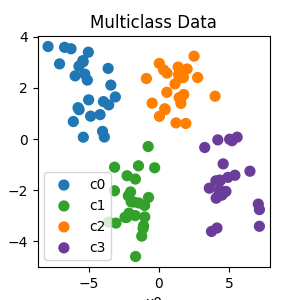

In [ ]:
plt_mc(X_train,y_train,classes, centers, std=std)

Each dot represents a training example. The axis (x0,x1) are the inputs and the color represents the class the example is associated with. Once trained, the model will be presented with a new example, (x0,x1), and will predict the class.  

While generated, this data set is representative of many real-world classification problems. There are several input features (x0,...,xn) and several output categories. The model is trained to use the input features to predict the correct output category.

In [ ]:
# show classes in data set
print(f"unique classes {np.unique(y_train)}")
# show how classes are represented
print(f"class representation {y_train[:20]}")
# show shapes of our dataset
print(f"shape of X_train: {X_train.shape}, shape of y_train: {y_train.shape}")

unique classes [0 1 2 3]
class representation [3 3 3 0 3 3 3 3 2 0 2 1 1 1 0 3 2 3 1 2]
shape of X_train: (100, 2), shape of y_train: (100,)


## 2.2 Model
<img align="Right" src="./images/C2_W2_mclass_lab_network.PNG"  style=" width:350px; padding: 10px 20px ; ">
This lab will use a 2-layer network as shown.
Unlike the binary classification networks, this network has four outputs, one for each class. Given an input example, the output with the highest value is the predicted class of the input.   

Below is an example of how to construct this network in Tensorflow. Notice the output layer uses a `linear` rather than a `softmax` activation. While it is possible to include the softmax in the output layer, it is more numerically stable if linear outputs are passed to the loss function during training. If the model is used to predict probabilities, the softmax can be applied at that point.

In [ ]:
tf.random.set_seed(1234)
model = Sequential(
    [
        Dense(2, activation='relu', name="L1"),
        Dense(4, activation='linear',name="L2")
    ]
)

The statements below compile and train the network. Setting `from_logits=True` as an argument to the loss function specifies that the output activation was linear rather than a softmax.

In [ ]:
model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(0.01),
)
model.fit(
    X_train, y_train,
    epochs=200
)

Epoch 1/200
4/4 [==============================] - 1s 12ms/step - loss: 1.6885
Epoch 2/200
4/4 [==============================] - 0s 8ms/step - loss: 1.4962
Epoch 3/200
4/4 [==============================] - 0s 7ms/step - loss: 1.3501
Epoch 4/200
4/4 [==============================] - 0s 8ms/step - loss: 1.2290
Epoch 5/200
4/4 [==============================] - 0s 15ms/step - loss: 1.1287
Epoch 6/200
4/4 [==============================] - 0s 5ms/step - loss: 1.0459
Epoch 7/200
4/4 [==============================] - 0s 5ms/step - loss: 0.9726
Epoch 8/200
4/4 [==============================] - 0s 14ms/step - loss: 0.9063
Epoch 9/200
4/4 [==============================] - 0s 7ms/step - loss: 0.8504
Epoch 10/200
4/4 [==============================] - 0s 6ms/step - loss: 0.7985
Epoch 11/200
4/4 [==============================] - 0s 11ms/step - loss: 0.7539
Epoch 12/200
4/4 [==============================] - 0s 5ms/step - loss: 0.7145
Epoch 13/200
4/4 [==============================] - 0s 8m

184/184 [==============================] - 1s 3ms/step


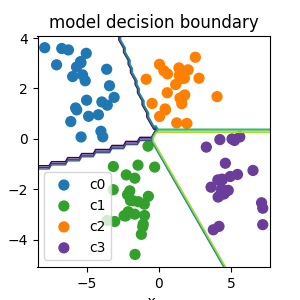

In [ ]:
plt_cat_mc(X_train, y_train, model, classes)

Above, the decision boundaries show how the model has partitioned the input space.  This very simple model has had no trouble classifying the training data. How did it accomplish this? Let's look at the network in more detail. 

Below, we will pull the trained weights from the model and use that to plot the function of each of the network units. Further down, there is a more detailed explanation of the results. You don't need to know these details to successfully use neural networks, but it may be helpful to gain more intuition about how the layers combine to solve a classification problem.

In [ ]:
#gather the trained parameters from the first layer
l1 = model.get_layer("L1")
W1,b1 = l1.get_weights()

In [ ]:
print(W1)
print(b1)

[[ 0.44870785  2.295577  ]
 [-2.8440776   1.4244626 ]]
[1.8943737 2.262237 ]


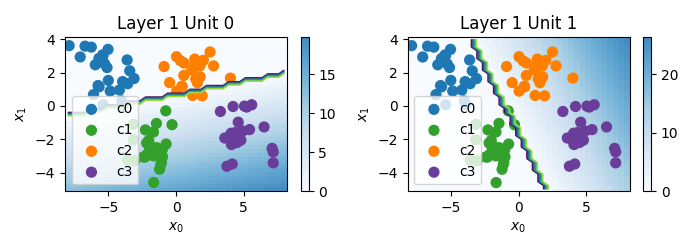

In [ ]:
# plot the function of the first layer
plt_layer_relu(X_train, y_train.reshape(-1,), W1, b1, classes)

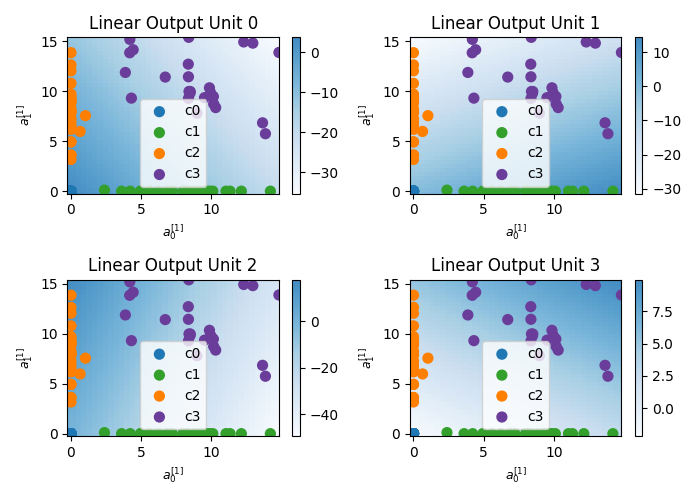

In [ ]:
# gather the trained parameters from the output layer
l2 = model.get_layer("L2")
W2, b2 = l2.get_weights()
# create the 'new features', the training examples after L1 transformation
Xl2 = np.maximum(0, np.dot(X_train,W1) + b1)

plt_output_layer_linear(Xl2, y_train.reshape(-1,), W2, b2, classes,
                        x0_rng = (-0.25,np.amax(Xl2[:,0])), x1_rng = (-0.25,np.amax(Xl2[:,1])))

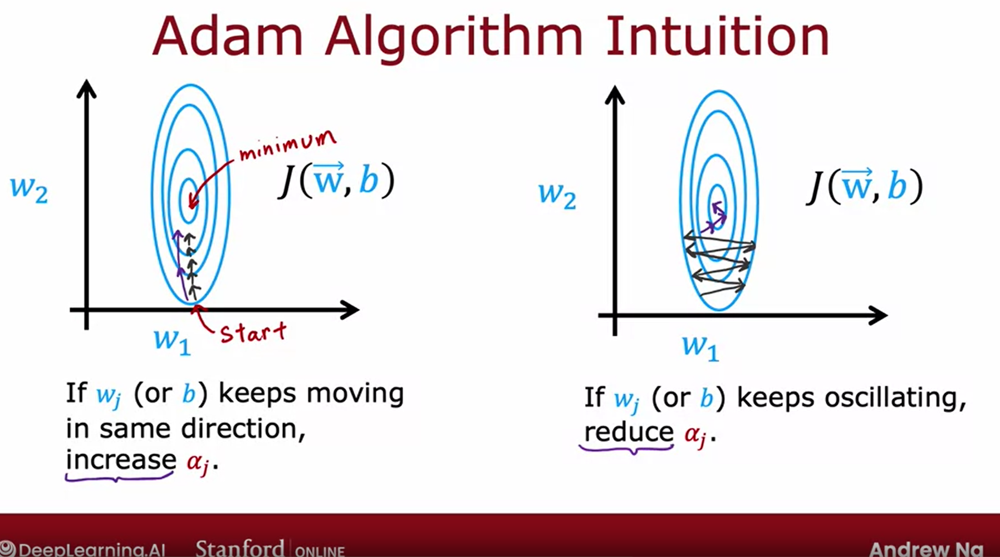

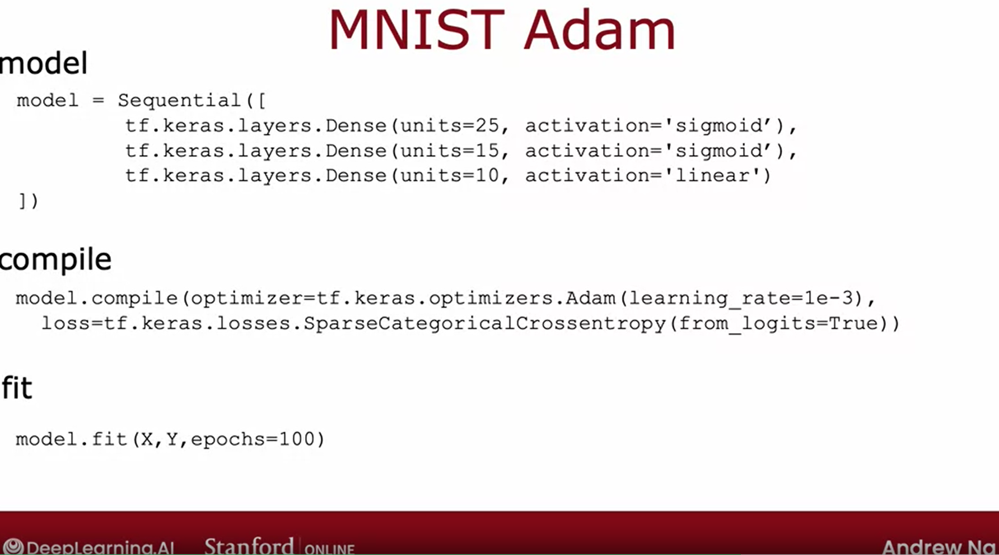

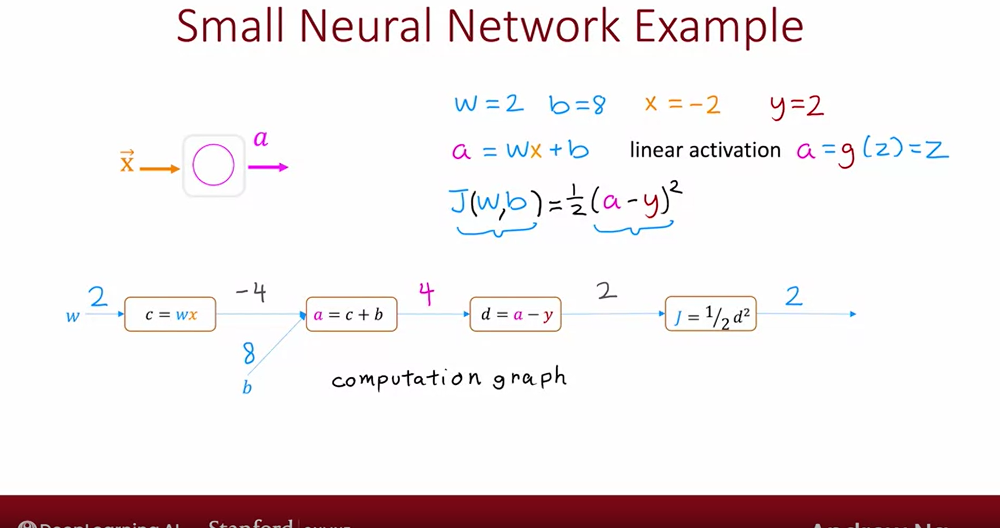

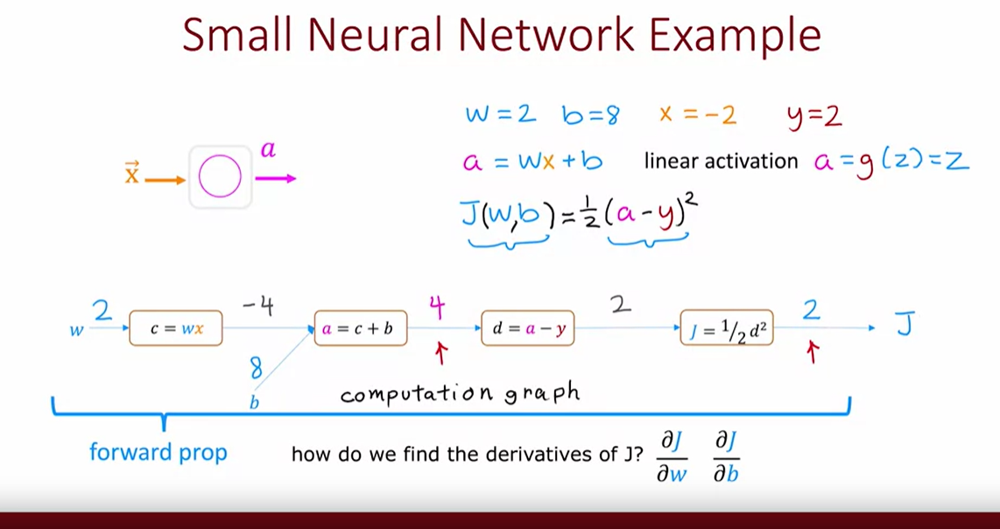

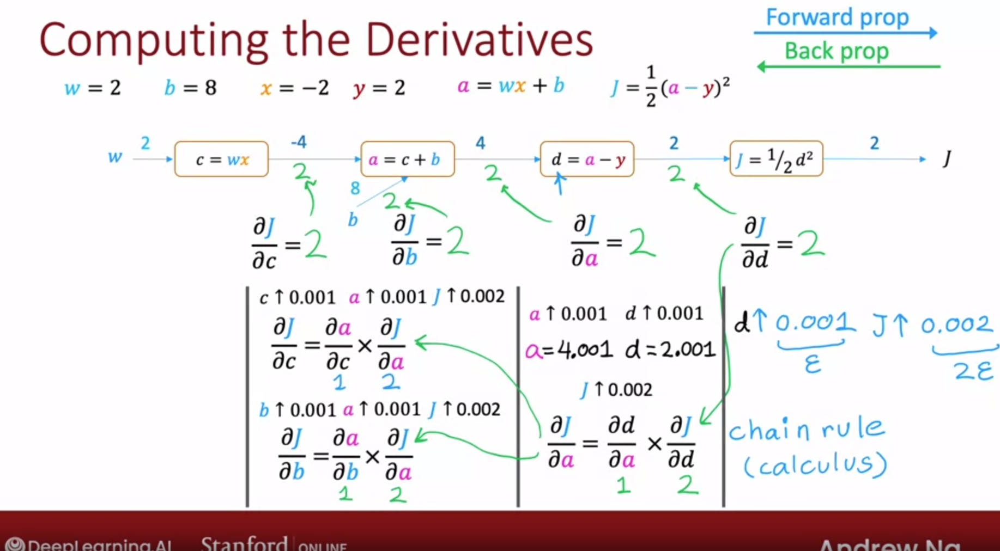

...

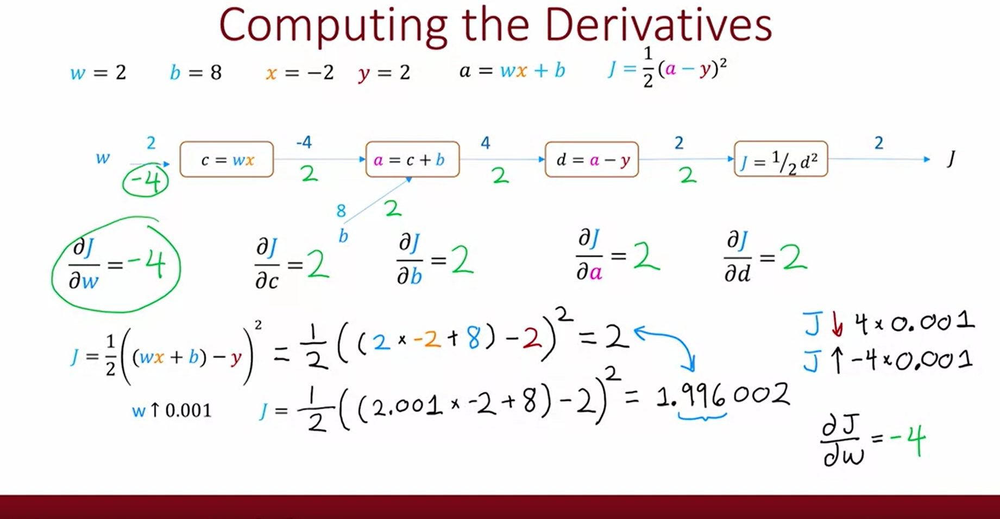

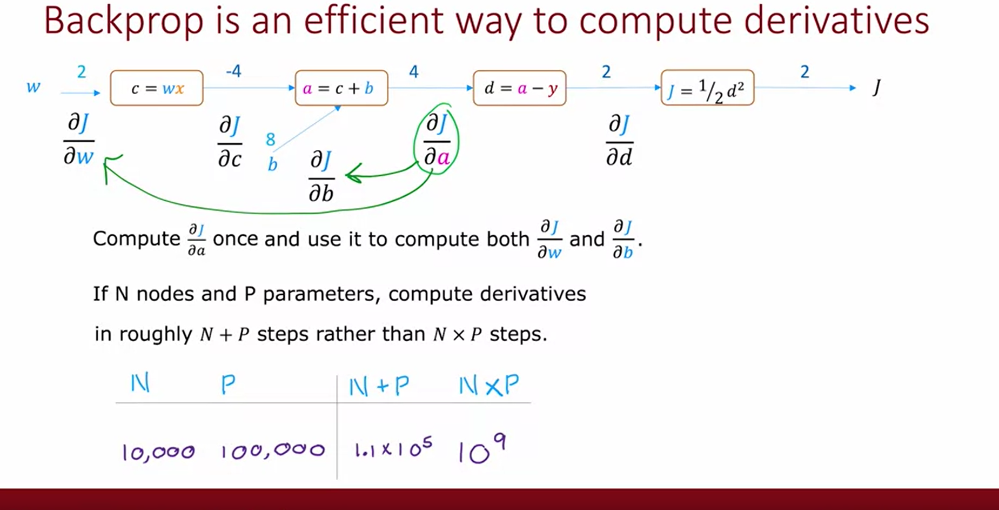

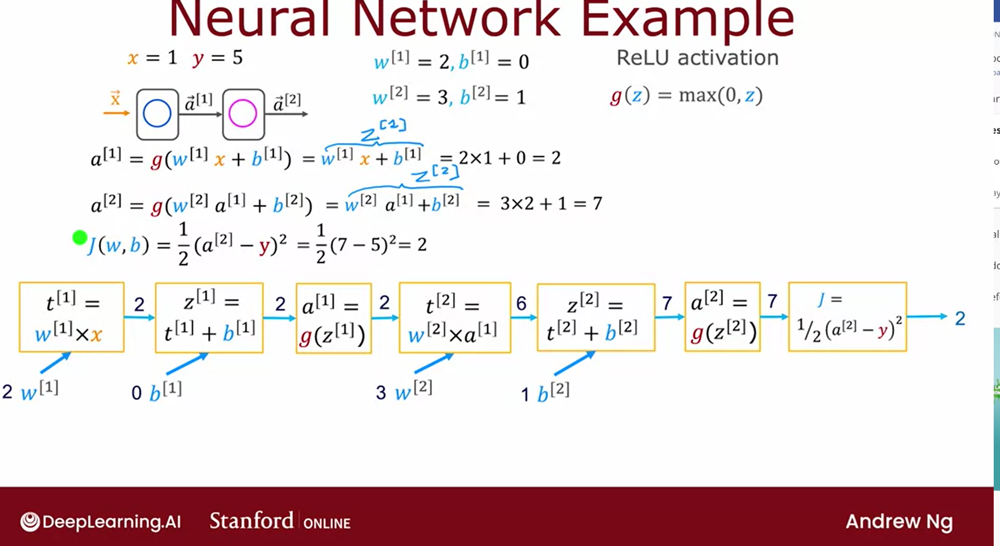

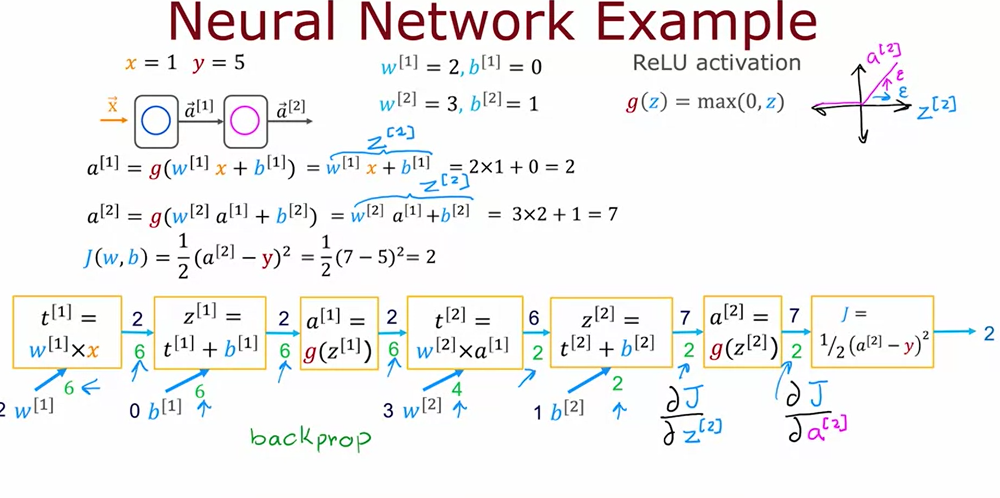

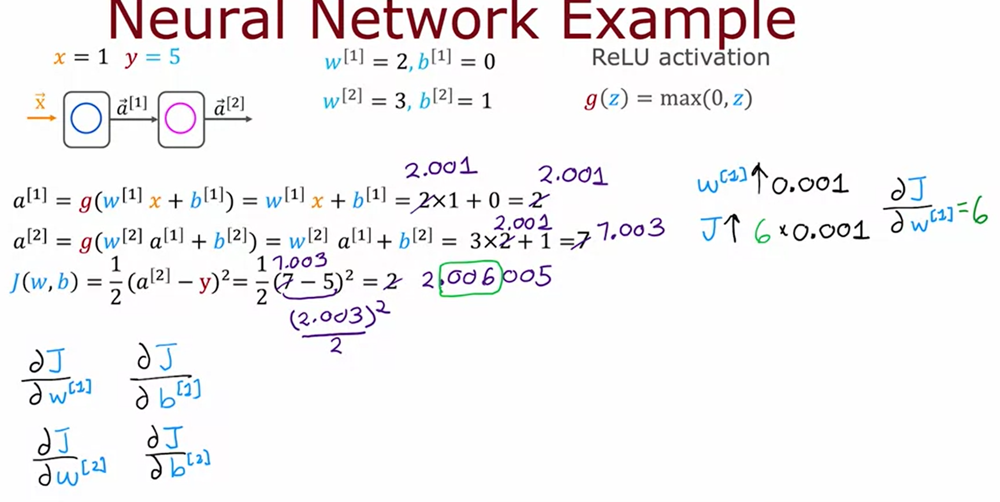

1.   Elemento de la lista
2.   Elemento de la lista

